# Preprocessing

## Packages

In [1]:
import pandas as pd             # Data analysis
import numpy as np              # Linear Algebra
import matplotlib.pyplot as plt # Plotting
import seaborn as sns           # Plotting
import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.svm import SVC                   # Support Vector Classifier
from sklearn.metrics import RocCurveDisplay   # ROC curve
from matplotlib.pyplot import subplots, cm
import sklearn.model_selection as skm                
from sklearn import preprocessing             # Normalization

In [3]:
from sklearn.utils import resample                    # Sample Reduction
from sklearn.model_selection import train_test_split  # Splitting data into train and test
from sklearn.preprocessing import scale               # Scaling Data
from sklearn.model_selection import GridSearchCV      # Cross Validation
from sklearn.metrics import confusion_matrix          # Truth vs Prediction Table
from sklearn.decomposition import PCA

## Exploratory Data Analysis (EDA)

### Data observation

We will first take a look  of the data itself by reading the data and checking the first few rows of some samples.

In [4]:
df = pd.read_csv("Beans.csv")  # Reading the data
print('Shape:', df.shape)      # the matrix dimension of our data
df.head()                      # first few samples of data.

Shape: (13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


### Data information

We will now check the types of features and variables we have alongside if there are any missing variables within the dataset.

In [5]:
df.info()                       # checking data types, note: Class should be the only object, and it is

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [6]:
df.nunique() # ammount of unique values in each column

Area               12011
Perimeter          13351
MajorAxisLength    13543
MinorAxisLength    13543
AspectRation       13543
Eccentricity       13543
ConvexArea         12066
EquivDiameter      12011
Extent             13535
Solidity           13522
roundness          13540
Compactness        13543
ShapeFactor1       13521
ShapeFactor2       13506
ShapeFactor3       13543
ShapeFactor4       13532
Class                  7
dtype: int64

In [7]:
df.isnull().sum() # the number of missing values in each column

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

* Since all features yield a value of 0, this means that the given data set we are currently looking at has no specfic missing value within any of its samples.

In [8]:
df.describe(include='all').T # Parameter of Variables 'all' includes categorical as well

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Area,13611.0,NaN,NaN,NaN,53048.284549,29324.095717,20420.0,36328.0,44652.0,61332.0,254616.0
Perimeter,13611.0,NaN,NaN,NaN,855.283459,214.289696,524.736,703.5235,794.941,977.213,1985.37
MajorAxisLength,13611.0,NaN,NaN,NaN,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,738.860154
MinorAxisLength,13611.0,NaN,NaN,NaN,202.270714,44.970091,122.512653,175.84817,192.431733,217.031741,460.198497
AspectRation,13611.0,NaN,NaN,NaN,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306
Eccentricity,13611.0,NaN,NaN,NaN,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,0.911423
ConvexArea,13611.0,NaN,NaN,NaN,53768.200206,29774.915817,20684.0,36714.5,45178.0,62294.0,263261.0
EquivDiameter,13611.0,NaN,NaN,NaN,253.06422,59.17712,161.243764,215.068003,238.438026,279.446467,569.374358
Extent,13611.0,NaN,NaN,NaN,0.749733,0.049086,0.555315,0.718634,0.759859,0.786851,0.866195
Solidity,13611.0,NaN,NaN,NaN,0.987143,0.00466,0.919246,0.98567,0.988283,0.990013,0.994677


* Looking at all the discriptive data, we can see many of the parameters attaining to their specific features. Focusing on Area, one can see that there could be a potential outlier since the data range from [min,max] is immensely wide considering the mean of Area is skewed to the left. We can see this clearly in the visualization below. I should note that through all these EDA process, we will specifically look at the feature 'Area' individually so save time but without loss of generality; we can apply this to all of the variables.

* As investigated earlier, we can clearly see with the graphs that there seems to be some sort of outlier under the 'Area' feature. The graph is truly skewed to the left and a possible transformation could be used to normalize the feature to help ease with conducting an analysis.

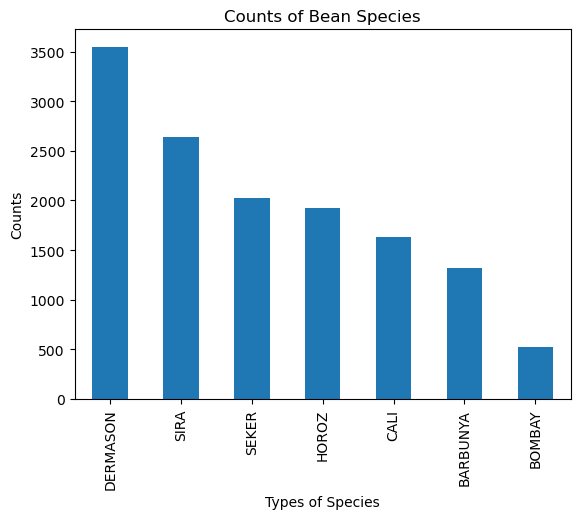

In [10]:
ax = df['Class'].value_counts().plot(kind='bar', title='Counts of Bean Species')
ax.set_ylabel('Counts')
ax.set_xlabel('Types of Species')
plt.show()

* We could also add an intermediate step to see the frequency barplot of our categorical data 'Class' to give us a better understanding of what the species of bean makes up majority of the dataset.

In [15]:
# Dropping old untransformed features

df = df.drop(columns = ['Area','Perimeter','MajorAxisLength','MinorAxisLength','Eccentricity','ConvexArea','EquivDiameter','Extent','Solidity','roundness','ShapeFactor4'])

* As stated earlier, due to the sknewness of 'Area' we can consider applying a transformation to make it more normalized. I may note that 'Area' is not the only feature that showed skewness in the data set and so the code will reflect that many other features need transformation as well. However, we will only be looking at 'Area' closely.

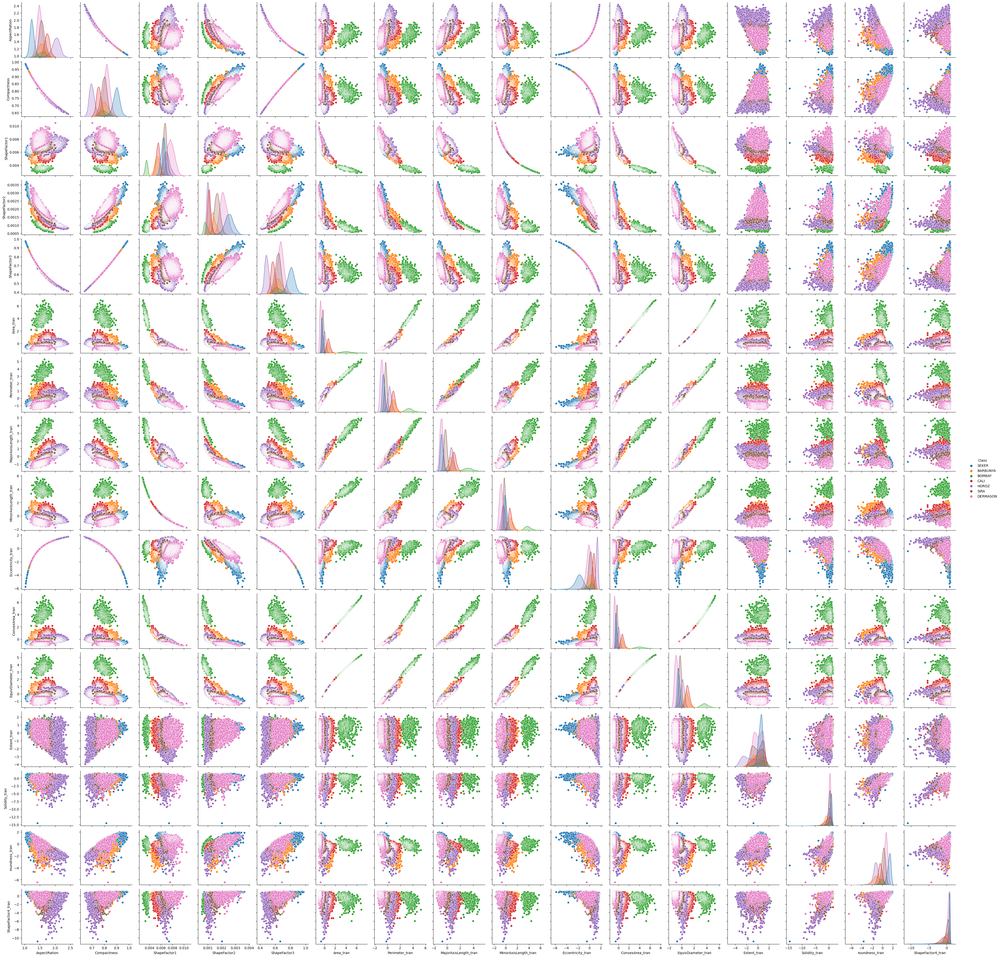

In [16]:
## plotting pairplot

sns.pairplot(df,vars = ['AspectRation', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'Area_tran', 'Perimeter_tran',
       'MajorAxisLength_tran', 'MinorAxisLength_tran', 'Eccentricity_tran',
       'ConvexArea_tran', 'EquivDiameter_tran', 'Extent_tran', 'Solidity_tran',
       'roundness_tran', 'ShapeFactor4_tran'],hue='Class')
plt.show()

* What you see above is a pairplot in a matrix structure such that it is plotting one feature against all the other without loss of generality. We may look the transformed 'Area_tran' ie the row $\textbf[6,:]$ we can clearly see that when compared to other feature, there are some high correlation pattern. We mate note that the different colour hue correspond to different classes of beans. We can suppose take a closer look at some of the variables as indicated by the pairplot.

<Axes: >

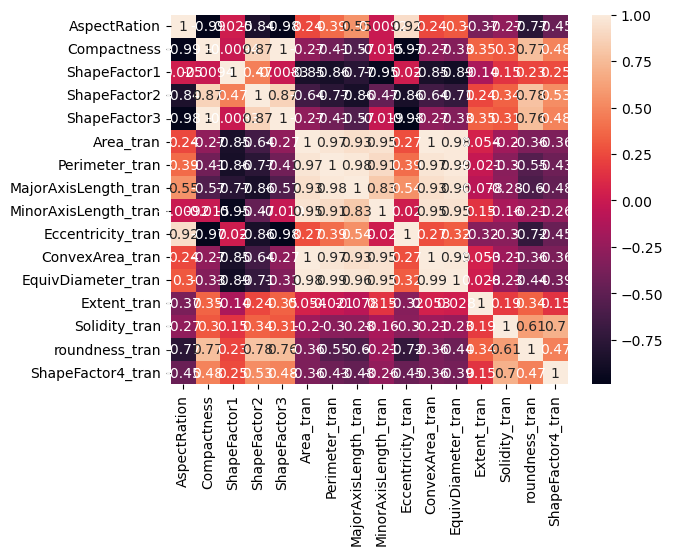

In [17]:
## correlation heat map

df_corr = df[['AspectRation', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'Area_tran', 'Perimeter_tran',
       'MajorAxisLength_tran', 'MinorAxisLength_tran', 'Eccentricity_tran',
       'ConvexArea_tran', 'EquivDiameter_tran', 'Extent_tran', 'Solidity_tran',
       'roundness_tran', 'ShapeFactor4_tran']].corr()
sns.heatmap(df_corr, annot=True) # Area might be redundant

* Observing the correlation map, it's evident that boxes displaying the darkest or lightest colors indicate a strong correlation among pairwise features. Notably, upon closer examination of 'Area_tran', we observe its notably high correlation with various other features like 'Perimeter', 'MajorAxisLength_tran', among others. While multiple approaches exist to address such correlations, the chosen course of action is to completely remove the 'Area_log' feature. Its high correlation with multiple variables poses the risk of multicollinearity, potentially complicating the application of classification methods.

<Axes: >

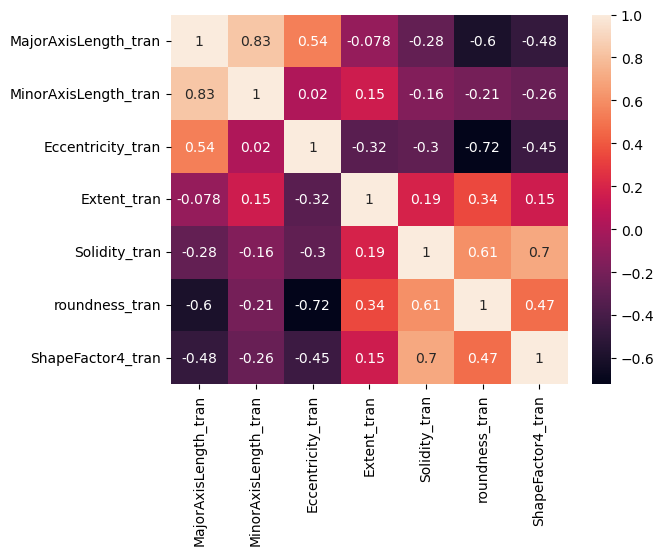

In [18]:
### Dropping Area and other variables that has high correlation

df = df.drop(columns = ['Area_tran','ConvexArea_tran','Perimeter_tran','AspectRation','EquivDiameter_tran','ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3','Compactness'])

### plotting heat map

df_corr = df[[
        'MajorAxisLength_tran', 'MinorAxisLength_tran',
       'Eccentricity_tran', 'Extent_tran', 'Solidity_tran', 'roundness_tran',
       'ShapeFactor4_tran']].corr()
sns.heatmap(df_corr,annot=True)

* The improved correlation map indicates a significant enhancement compared to the previous version, with the highest correlation now standing at 0.83. Following the removal of numerous features, we are left with a set of 7 distinct variables to serve as predictors, aiming to bolster the development of a robust model for predicting our response variable, 'Class'.